<a href="https://colab.research.google.com/github/TeiTaeyoungKim/hello-world/blob/master/image_gen_2_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



# VQGAN and CLIP (z+quantize method) for Discord Dummies

v2.0 - added negative prompts, iter limits
Ask olly#1978 if this breaks

In [ ]:
#@title Optional - display the GPU colab has given you
!nvidia-smi -L

In [1]:
%%capture
#@title 1. Run me first!
!git clone https://github.com/openai/CLIP
!git clone https://github.com/CompVis/taming-transformers
!pip install ftfy regex tqdm omegaconf pytorch-lightning
!pip install kornia
!pip install einops

!curl -L 'https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fconfigs%2Fmodel.yaml&dl=1' > vqgan_imagenet_f16_16384.yaml
!curl -L 'https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fckpts%2Flast.ckpt&dl=1' > vqgan_imagenet_f16_16384.ckpt

!curl -L https://dl.nmkd.de/ai/clip/vqgan/8k-2021-06/vqgan-f8-8192.ckpt > vqgan_openimages_f16_8192.ckpt
!curl -L https://dl.nmkd.de/ai/clip/vqgan/8k-2021-06/vqgan-f8-8192.yaml > vqgan_openimages_f16_8192.yaml

import argparse
import math
from pathlib import Path
import sys
import time

sys.path.append('./taming-transformers')

from IPython import display
from omegaconf import OmegaConf
from PIL import Image
from taming.models import cond_transformer, vqgan
import torch
from torch import nn, optim
from torch.nn import functional as F
from torchvision import transforms
from torchvision.transforms import functional as TF
from tqdm.notebook import tqdm
import numpy as np

from CLIP import clip

import kornia.augmentation as K

def noise_gen(shape):
    n, c, h, w = shape
    noise = torch.zeros([n, c, 1, 1])
    for i in reversed(range(5)):
        h_cur, w_cur = h // 2**i, w // 2**i
        noise = F.interpolate(noise, (h_cur, w_cur), mode='bicubic', align_corners=False)
        noise += torch.randn([n, c, h_cur, w_cur]) / 5
    return noise


def sinc(x):
    return torch.where(x != 0, torch.sin(math.pi * x) / (math.pi * x), x.new_ones([]))


def lanczos(x, a):
    cond = torch.logical_and(-a < x, x < a)
    out = torch.where(cond, sinc(x) * sinc(x/a), x.new_zeros([]))
    return out / out.sum()


def ramp(ratio, width):
    n = math.ceil(width / ratio + 1)
    out = torch.empty([n])
    cur = 0
    for i in range(out.shape[0]):
        out[i] = cur
        cur += ratio
    return torch.cat([-out[1:].flip([0]), out])[1:-1]


def resample(input, size, align_corners=True):
    n, c, h, w = input.shape
    dh, dw = size

    input = input.view([n * c, 1, h, w])

    if dh < h:
        kernel_h = lanczos(ramp(dh / h, 2), 2).to(input.device, input.dtype)
        pad_h = (kernel_h.shape[0] - 1) // 2
        input = F.pad(input, (0, 0, pad_h, pad_h), 'reflect')
        input = F.conv2d(input, kernel_h[None, None, :, None])

    if dw < w:
        kernel_w = lanczos(ramp(dw / w, 2), 2).to(input.device, input.dtype)
        pad_w = (kernel_w.shape[0] - 1) // 2
        input = F.pad(input, (pad_w, pad_w, 0, 0), 'reflect')
        input = F.conv2d(input, kernel_w[None, None, None, :])

    input = input.view([n, c, h, w])
    return F.interpolate(input, size, mode='bicubic', align_corners=align_corners)
    

# def replace_grad(fake, real):
#     return fake.detach() - real.detach() + real


class ReplaceGrad(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x_forward, x_backward):
        ctx.shape = x_backward.shape
        return x_forward

    @staticmethod
    def backward(ctx, grad_in):
        return None, grad_in.sum_to_size(ctx.shape)


class ClampWithGrad(torch.autograd.Function):
    @staticmethod
    def forward(ctx, input, min, max):
        ctx.min = min
        ctx.max = max
        ctx.save_for_backward(input)
        return input.clamp(min, max)

    @staticmethod
    def backward(ctx, grad_in):
        input, = ctx.saved_tensors
        return grad_in * (grad_in * (input - input.clamp(ctx.min, ctx.max)) >= 0), None, None

replace_grad = ReplaceGrad.apply

clamp_with_grad = ClampWithGrad.apply
# clamp_with_grad = torch.clamp

def vector_quantize(x, codebook):
    d = x.pow(2).sum(dim=-1, keepdim=True) + codebook.pow(2).sum(dim=1) - 2 * x @ codebook.T
    indices = d.argmin(-1)
    x_q = F.one_hot(indices, codebook.shape[0]).to(d.dtype) @ codebook
    return replace_grad(x_q, x)


class Prompt(nn.Module):
    def __init__(self, embed, weight=1., stop=float('-inf')):
        super().__init__()
        self.register_buffer('embed', embed)
        self.register_buffer('weight', torch.as_tensor(weight))
        self.register_buffer('stop', torch.as_tensor(stop))

    def forward(self, input):
        
        input_normed = F.normalize(input.unsqueeze(1), dim=2)#(input / input.norm(dim=-1, keepdim=True)).unsqueeze(1)# 
        embed_normed = F.normalize((self.embed).unsqueeze(0), dim=2)#(self.embed / self.embed.norm(dim=-1, keepdim=True)).unsqueeze(0)#

        dists = input_normed.sub(embed_normed).norm(dim=2).div(2).arcsin().pow(2).mul(2)
        dists = dists * self.weight.sign()
        return self.weight.abs() * replace_grad(dists, torch.maximum(dists, self.stop)).mean()


def parse_prompt(prompt):
    vals = prompt.rsplit(':', 2)
    vals = vals + ['', '1', '-inf'][len(vals):]
    return vals[0], float(vals[1]), float(vals[2])

def one_sided_clip_loss(input, target, labels=None, logit_scale=100):
    input_normed = F.normalize(input, dim=-1)
    target_normed = F.normalize(target, dim=-1)
    logits = input_normed @ target_normed.T * logit_scale
    if labels is None:
        labels = torch.arange(len(input), device=logits.device)
    return F.cross_entropy(logits, labels)

class MakeCutouts(nn.Module):
    def __init__(self, cut_size, cutn, cut_pow=1.):
        super().__init__()
        self.cut_size = cut_size
        self.cutn = cutn
        self.cut_pow = cut_pow

        self.av_pool = nn.AdaptiveAvgPool2d((self.cut_size, self.cut_size))
        self.max_pool = nn.AdaptiveMaxPool2d((self.cut_size, self.cut_size))

    def set_cut_pow(self, cut_pow):
      self.cut_pow = cut_pow

    def forward(self, input):
        sideY, sideX = input.shape[2:4]
        max_size = min(sideX, sideY)
        min_size = min(sideX, sideY, self.cut_size)
        cutouts = []
        cutouts_full = []
        
        min_size_width = min(sideX, sideY)
        lower_bound = float(self.cut_size/min_size_width)
        
        for ii in range(self.cutn):
            
            
          # size = int(torch.rand([])**self.cut_pow * (max_size - min_size) + min_size)
          size = int(min_size_width*torch.zeros(1,).normal_(mean=.8, std=.3).clip(lower_bound, 1.)) # replace .5 with a result for 224 the default large size is .95
          # size = int(min_size_width*torch.zeros(1,).normal_(mean=.9, std=.3).clip(lower_bound, .95)) # replace .5 with a result for 224 the default large size is .95

          offsetx = torch.randint(0, sideX - size + 1, ())
          offsety = torch.randint(0, sideY - size + 1, ())
          cutout = input[:, :, offsety:offsety + size, offsetx:offsetx + size]
          cutouts.append(resample(cutout, (self.cut_size, self.cut_size)))

        
        cutouts = torch.cat(cutouts, dim=0)

        # if args.use_augs:
        #   cutouts = augs(cutouts)

        # if args.noise_fac:
        #   facs = cutouts.new_empty([cutouts.shape[0], 1, 1, 1]).uniform_(0, args.noise_fac)
        #   cutouts = cutouts + facs * torch.randn_like(cutouts)
        

        return clamp_with_grad(cutouts, 0, 1)


def load_vqgan_model(config_path, checkpoint_path):
    config = OmegaConf.load(config_path)
    if config.model.target == 'taming.models.vqgan.VQModel':
        model = vqgan.VQModel(**config.model.params)
        model.eval().requires_grad_(False)
        model.init_from_ckpt(checkpoint_path)
    elif config.model.target == 'taming.models.cond_transformer.Net2NetTransformer':
        parent_model = cond_transformer.Net2NetTransformer(**config.model.params)
        parent_model.eval().requires_grad_(False)
        parent_model.init_from_ckpt(checkpoint_path)
        model = parent_model.first_stage_model
    elif config.model.target == 'taming.models.vqgan.GumbelVQ':
        model = vqgan.GumbelVQ(**config.model.params)
        model.eval().requires_grad_(False)
        model.init_from_ckpt(checkpoint_path)
    else:
        raise ValueError(f'unknown model type: {config.model.target}')
    del model.loss
    return model

def resize_image(image, out_size):
    ratio = image.size[0] / image.size[1]
    area = min(image.size[0] * image.size[1], out_size[0] * out_size[1])
    size = round((area * ratio)**0.5), round((area / ratio)**0.5)
    return image.resize(size, Image.LANCZOS)

class TVLoss(nn.Module):
    def forward(self, input):
        input = F.pad(input, (0, 1, 0, 1), 'replicate')
        x_diff = input[..., :-1, 1:] - input[..., :-1, :-1]
        y_diff = input[..., 1:, :-1] - input[..., :-1, :-1]
        diff = x_diff**2 + y_diff**2 + 1e-8
        return diff.mean(dim=1).sqrt().mean()

class GaussianBlur2d(nn.Module):
    def __init__(self, sigma, window=0, mode='reflect', value=0):
        super().__init__()
        self.mode = mode
        self.value = value
        if not window:
            window = max(math.ceil((sigma * 6 + 1) / 2) * 2 - 1, 3)
        if sigma:
            kernel = torch.exp(-(torch.arange(window) - window // 2)**2 / 2 / sigma**2)
            kernel /= kernel.sum()
        else:
            kernel = torch.ones([1])
        self.register_buffer('kernel', kernel)

    def forward(self, input):
        n, c, h, w = input.shape
        input = input.view([n * c, 1, h, w])
        start_pad = (self.kernel.shape[0] - 1) // 2
        end_pad = self.kernel.shape[0] // 2
        input = F.pad(input, (start_pad, end_pad, start_pad, end_pad), self.mode, self.value)
        input = F.conv2d(input, self.kernel[None, None, None, :])
        input = F.conv2d(input, self.kernel[None, None, :, None])
        return input.view([n, c, h, w])

class EMATensor(nn.Module):
    """implmeneted by Katherine Crowson"""
    def __init__(self, tensor, decay):
        super().__init__()
        self.tensor = nn.Parameter(tensor)
        self.register_buffer('biased', torch.zeros_like(tensor))
        self.register_buffer('average', torch.zeros_like(tensor))
        self.decay = decay
        self.register_buffer('accum', torch.tensor(1.))
        self.update()
    
    @torch.no_grad()
    def update(self):
        if not self.training:
            raise RuntimeError('update() should only be called during training')

        self.accum *= self.decay
        self.biased.mul_(self.decay)
        self.biased.add_((1 - self.decay) * self.tensor)
        self.average.copy_(self.biased)
        self.average.div_(1 - self.accum)

    def forward(self):
        if self.training:
            return self.tensor
        return self.average

%mkdir /content/vids

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

8.19kB [00:00, 91.9kB/s]                   


loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from vqgan_imagenet_f16_16384.ckpt


100%|███████████████████████████████████████| 338M/338M [00:05<00:00, 62.7MiB/s]


0it [00:00, ?it/s]

i: 0, loss: 11.3187, losses: 0, 1.03495, 0.184508, 0.879766, 0.972246, 0.949759, 0.468825, 0.283395, 0.265433, 0.27808, 0.906538, 0.460807, 0.46661, 0.711538, 0.904229, 0.924781, 0.472158, 0.906115, 0.942069, -0.698963, 0.526185, -0.454781, -0.454048, 0.463688, 0.465268, 0.267777, 0.280793, 0.915021, 0.453784, 0.444397, 0.271109, 0.937071, -0.45764, -0.453917, -0.451987, -0.465266, -0.460959, -0.888654, -0.931991
iteration:0, time:37s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing edges:0.5', 

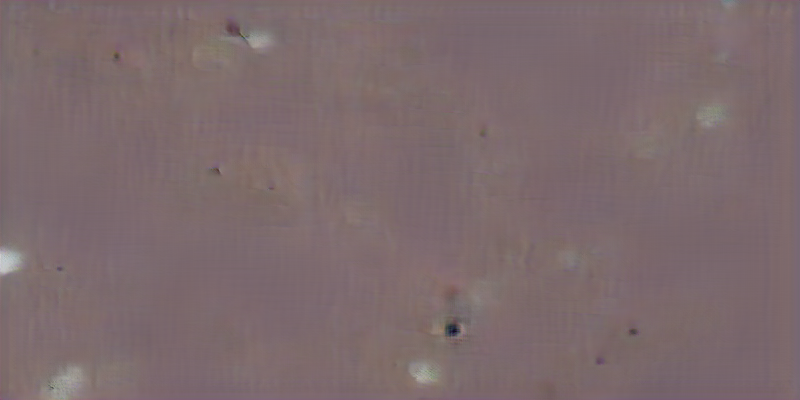

i: 25, loss: 10.6715, losses: 0.137214, 0.908812, 0.176825, 0.848803, 0.97022, 0.863397, 0.425778, 0.267284, 0.250677, 0.261046, 0.830664, 0.445792, 0.472327, 0.703234, 0.861458, 0.842694, 0.45135, 0.820797, 0.903038, -0.680499, 0.518685, -0.452285, -0.422263, 0.454637, 0.453689, 0.260607, 0.273169, 0.865103, 0.419208, 0.402927, 0.245604, 0.8946, -0.447738, -0.449323, -0.421838, -0.455125, -0.444292, -0.885931, -0.898847
iteration:25, time:67s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing edg

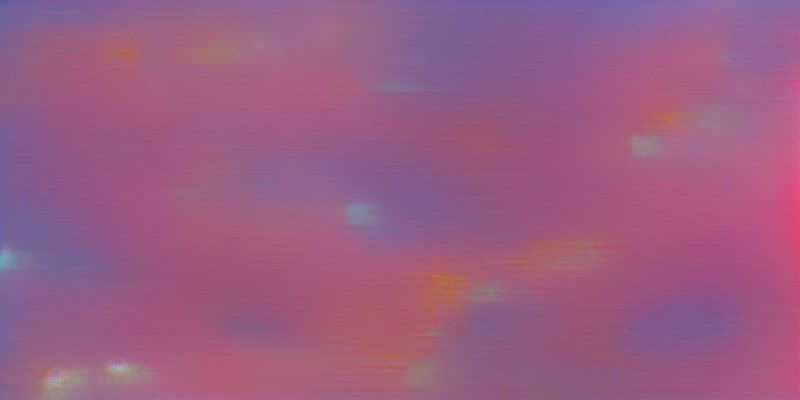

updated mse weight: 0.4
i: 50, loss: 10.5944, losses: 0.234341, 0.862566, 0.176613, 0.847902, 0.962133, 0.842827, 0.420788, 0.261126, 0.252861, 0.257697, 0.823856, 0.441245, 0.46687, 0.698565, 0.853516, 0.832059, 0.446991, 0.805906, 0.891713, -0.676186, 0.522645, -0.451867, -0.420373, 0.447629, 0.448257, 0.261015, 0.272216, 0.865885, 0.42087, 0.398716, 0.245018, 0.887575, -0.445224, -0.447719, -0.421858, -0.455713, -0.446011, -0.894051, -0.895966
iteration:50, time:99s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'bl

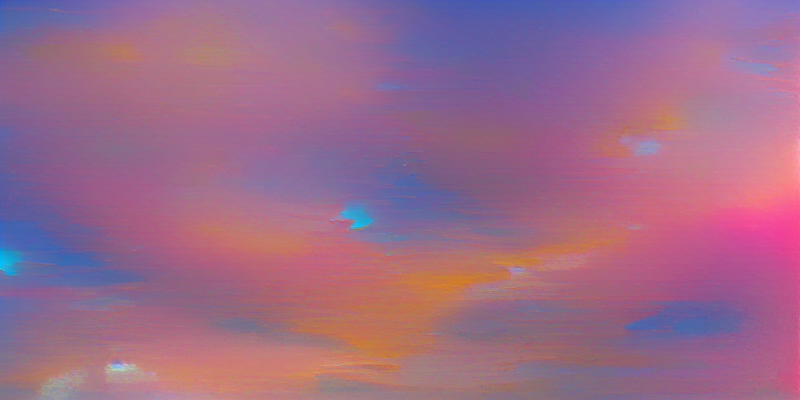

i: 75, loss: 10.3744, losses: 0.101499, 0.837513, 0.17662, 0.85137, 0.960886, 0.838386, 0.413854, 0.259125, 0.250728, 0.255158, 0.823766, 0.434383, 0.456083, 0.69566, 0.839773, 0.825834, 0.446293, 0.79935, 0.879718, -0.667423, 0.528794, -0.448363, -0.416431, 0.441059, 0.443464, 0.256409, 0.270206, 0.867724, 0.417289, 0.39592, 0.243773, 0.882127, -0.44346, -0.445581, -0.417011, -0.44721, -0.449499, -0.891392, -0.891958
iteration:75, time:130s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing edges

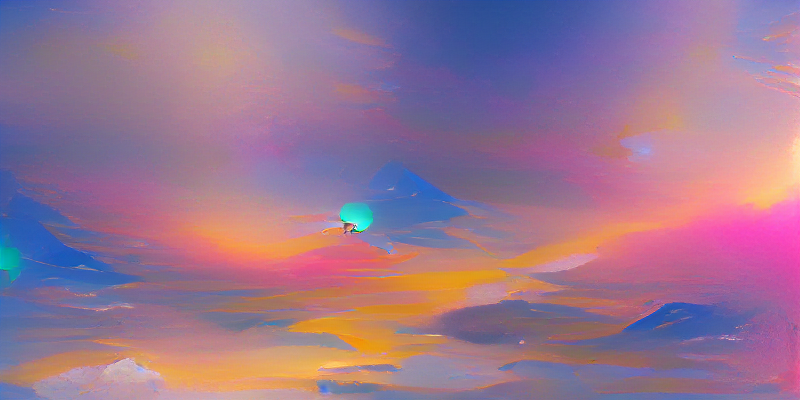

updated mse weight: 0.30000000000000004
i: 100, loss: 10.2911, losses: 0.119974, 0.840136, 0.178303, 0.839108, 0.962603, 0.84842, 0.419978, 0.2615, 0.251549, 0.25212, 0.826098, 0.423273, 0.442328, 0.691034, 0.815141, 0.81159, 0.444816, 0.794655, 0.886049, -0.670024, 0.530595, -0.449242, -0.422508, 0.441673, 0.439235, 0.254744, 0.26747, 0.860718, 0.412142, 0.394564, 0.24351, 0.886409, -0.445122, -0.447791, -0.417085, -0.448103, -0.454799, -0.893704, -0.900271
iteration:100, time:161s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose ga

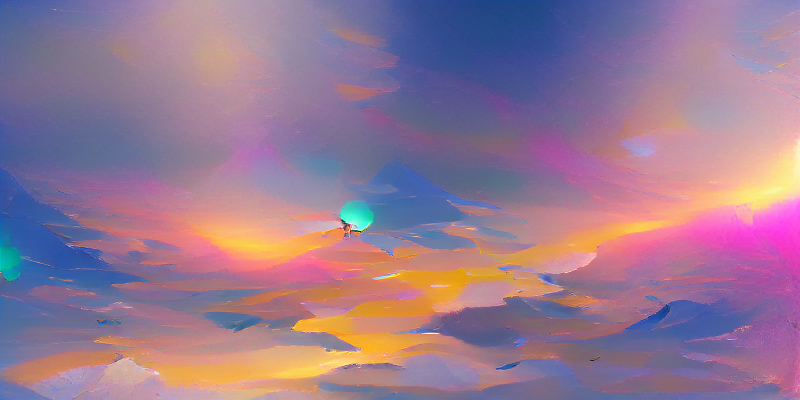

i: 125, loss: 10.1767, losses: 0.0761678, 0.825493, 0.178457, 0.835248, 0.956843, 0.847936, 0.416643, 0.262208, 0.250611, 0.249926, 0.824352, 0.417561, 0.436129, 0.688782, 0.805709, 0.804114, 0.4449, 0.789104, 0.881249, -0.66527, 0.531226, -0.44894, -0.420678, 0.440608, 0.438802, 0.253164, 0.265711, 0.860047, 0.409874, 0.393143, 0.243054, 0.883835, -0.445524, -0.447528, -0.416789, -0.447871, -0.454885, -0.889053, -0.897631
iteration:125, time:192s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing

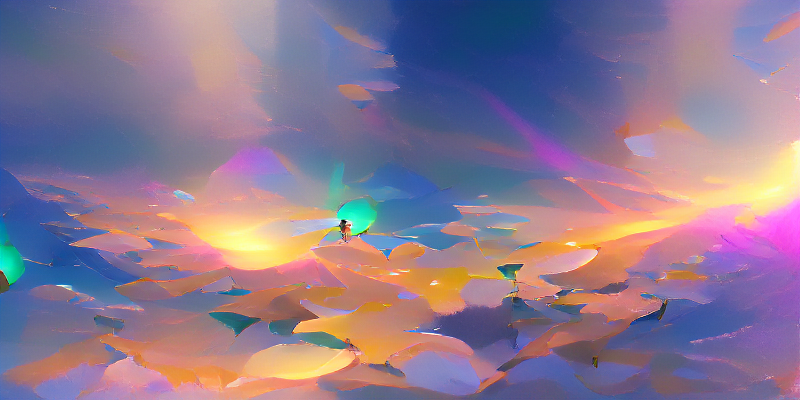

updated mse weight: 0.20000000000000004
i: 150, loss: 10.1692, losses: 0.0959098, 0.831124, 0.180125, 0.834348, 0.951822, 0.854345, 0.423757, 0.263258, 0.250271, 0.247597, 0.82919, 0.410938, 0.430572, 0.684862, 0.810044, 0.807804, 0.444391, 0.790221, 0.885785, -0.672209, 0.533034, -0.450824, -0.426939, 0.43874, 0.43815, 0.252456, 0.261777, 0.859537, 0.409268, 0.395285, 0.244867, 0.886883, -0.447846, -0.448629, -0.420565, -0.451093, -0.457591, -0.894886, -0.906549
iteration:150, time:222s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'ro

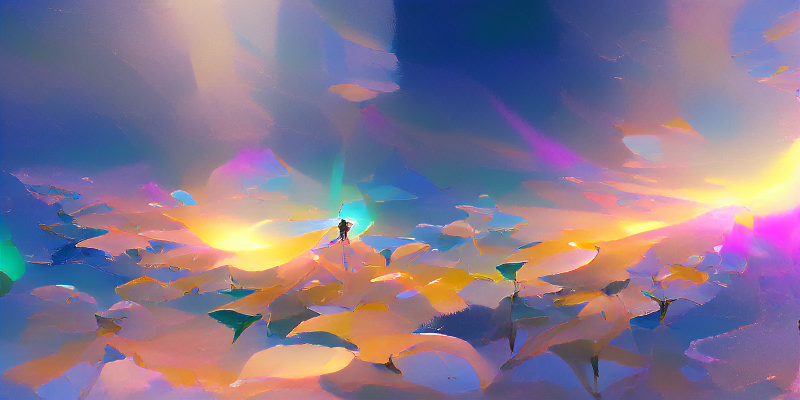

i: 175, loss: 10.085, losses: 0.0574628, 0.823696, 0.177774, 0.830718, 0.948567, 0.849248, 0.418761, 0.26172, 0.250672, 0.246023, 0.824675, 0.40669, 0.423338, 0.688123, 0.805678, 0.804579, 0.444383, 0.789432, 0.878478, -0.667789, 0.532047, -0.450116, -0.421797, 0.438381, 0.43814, 0.250747, 0.259825, 0.862674, 0.407602, 0.394122, 0.243304, 0.886449, -0.447366, -0.44932, -0.419786, -0.448474, -0.457115, -0.89233, -0.904205
iteration:175, time:253s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing e

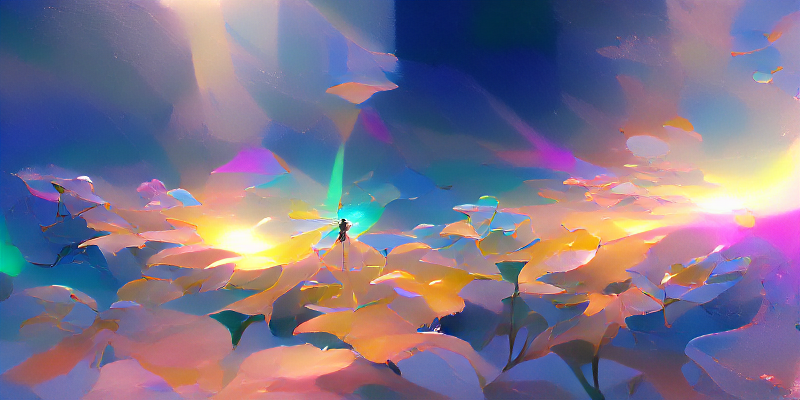

updated mse weight: 0.10000000000000003
i: 200, loss: 10.1115, losses: 0.074823, 0.829178, 0.179273, 0.830644, 0.943653, 0.852675, 0.421125, 0.263687, 0.25156, 0.24755, 0.825426, 0.410068, 0.428663, 0.685821, 0.802949, 0.801576, 0.444476, 0.787595, 0.882134, -0.670946, 0.530987, -0.449338, -0.424277, 0.43821, 0.437125, 0.252607, 0.260071, 0.860602, 0.407877, 0.393329, 0.244004, 0.886672, -0.447932, -0.448153, -0.419892, -0.448693, -0.456855, -0.890734, -0.90601
iteration:200, time:283s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose

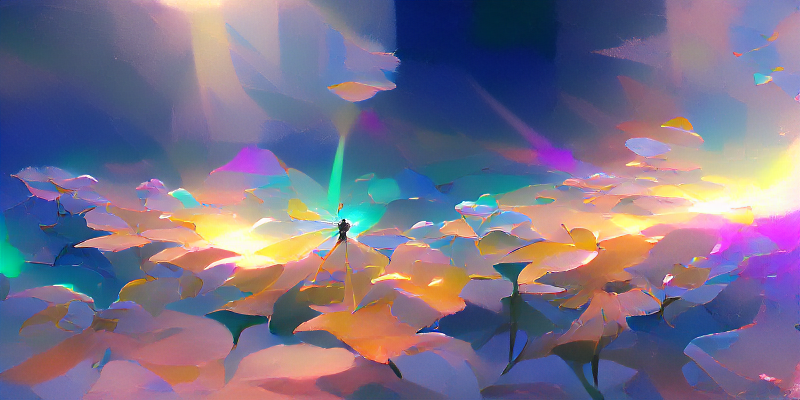

i: 225, loss: 10.0769, losses: 0.0375578, 0.831258, 0.177577, 0.825905, 0.948837, 0.850147, 0.422075, 0.2607, 0.251447, 0.246884, 0.825111, 0.413871, 0.430044, 0.686459, 0.803637, 0.798813, 0.444904, 0.785614, 0.881433, -0.672833, 0.532542, -0.450052, -0.424558, 0.439375, 0.43911, 0.254104, 0.262297, 0.860172, 0.40915, 0.393146, 0.244586, 0.887504, -0.448425, -0.447566, -0.418683, -0.450031, -0.457037, -0.891088, -0.907058
iteration:225, time:313s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing

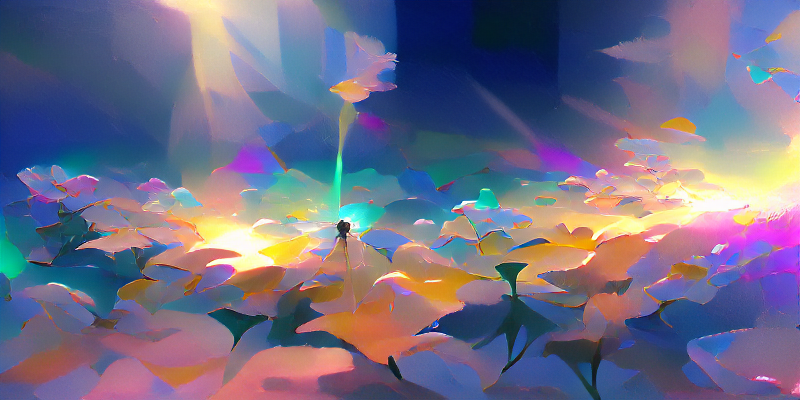

updated mse weight: 0
i: 250, loss: 10.0532, losses: 0.0531067, 0.827657, 0.178891, 0.823244, 0.943165, 0.852589, 0.422759, 0.262467, 0.250743, 0.2462, 0.829384, 0.406797, 0.423894, 0.682241, 0.799717, 0.800206, 0.446613, 0.785038, 0.883675, -0.672136, 0.53544, -0.449631, -0.425884, 0.437157, 0.439008, 0.251512, 0.259251, 0.860068, 0.407711, 0.393069, 0.244291, 0.887426, -0.44827, -0.447972, -0.421741, -0.450095, -0.460018, -0.893931, -0.9104
iteration:250, time:344s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur

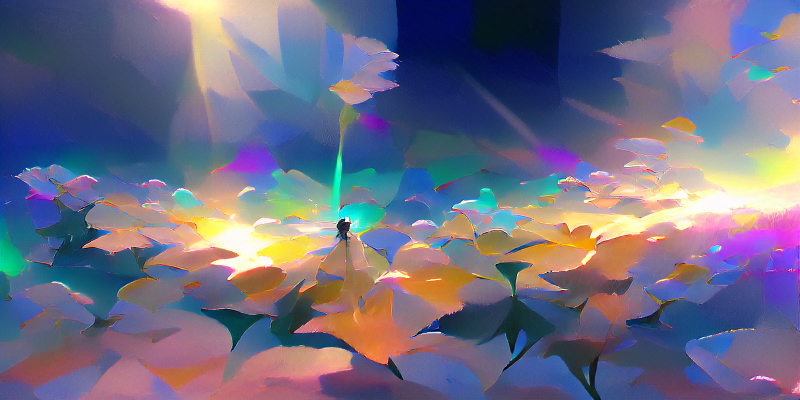

i: 275, loss: 10.0047, losses: 0, 0.837856, 0.178083, 0.825377, 0.943442, 0.847365, 0.421392, 0.260725, 0.249781, 0.245838, 0.826469, 0.406311, 0.427623, 0.685491, 0.801793, 0.800362, 0.442946, 0.786468, 0.88007, -0.67434, 0.531526, -0.447727, -0.426079, 0.438957, 0.435277, 0.252562, 0.258589, 0.856901, 0.406391, 0.395182, 0.245239, 0.886887, -0.448365, -0.44864, -0.418088, -0.449743, -0.456364, -0.894178, -0.90664
iteration:275, time:374s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing edges:0

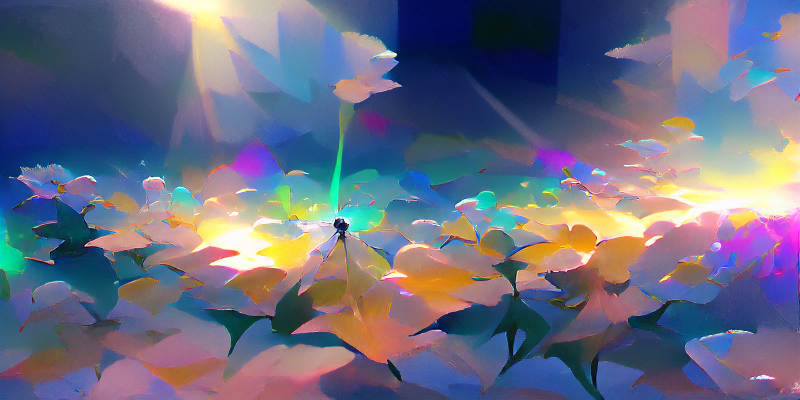

i: 300, loss: 9.96551, losses: 0, 0.823595, 0.17871, 0.823103, 0.945375, 0.843808, 0.421094, 0.261387, 0.250888, 0.245874, 0.826743, 0.404598, 0.421151, 0.684809, 0.795121, 0.797951, 0.444124, 0.78447, 0.875535, -0.674874, 0.539482, -0.448176, -0.42468, 0.436259, 0.436619, 0.250999, 0.257871, 0.859486, 0.40701, 0.393098, 0.243883, 0.884556, -0.448834, -0.449122, -0.418715, -0.447965, -0.459448, -0.893138, -0.907145
iteration:300, time:404s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing edges:0

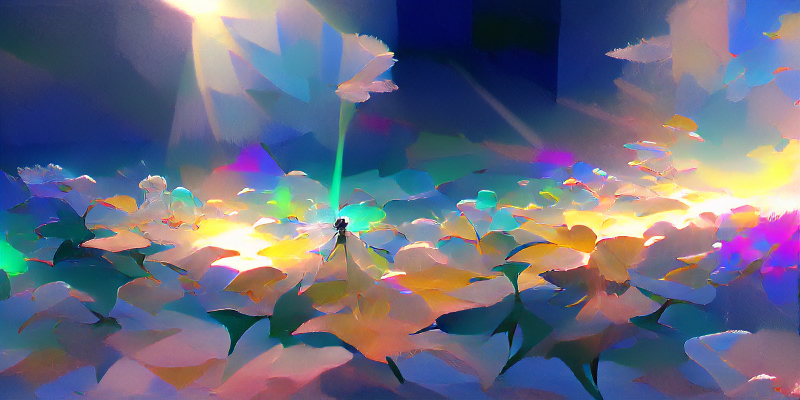

i: 325, loss: 9.97365, losses: 0, 0.823093, 0.177484, 0.821121, 0.945716, 0.842306, 0.421485, 0.261526, 0.249685, 0.245208, 0.826966, 0.406199, 0.422699, 0.687648, 0.79628, 0.797945, 0.444131, 0.784127, 0.876477, -0.675886, 0.538673, -0.447773, -0.425033, 0.436493, 0.438262, 0.251333, 0.258309, 0.861785, 0.407982, 0.39375, 0.244437, 0.885144, -0.449184, -0.449357, -0.418407, -0.449315, -0.45926, -0.891933, -0.906469
iteration:325, time:434s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing edges:

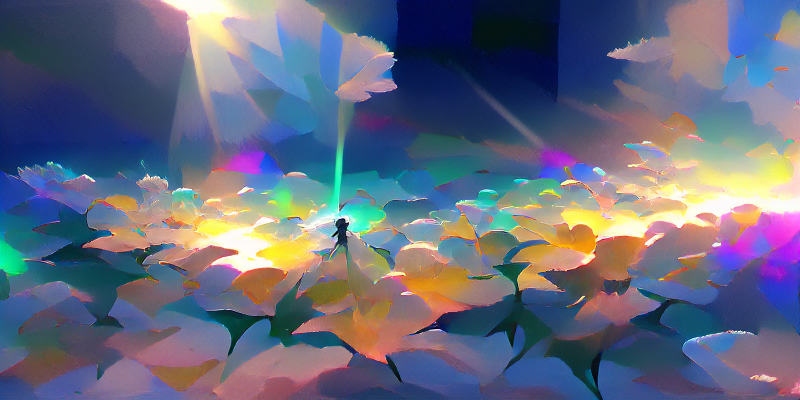

i: 350, loss: 9.92912, losses: 0, 0.825493, 0.178412, 0.823482, 0.931736, 0.842631, 0.420225, 0.257581, 0.249274, 0.243773, 0.829977, 0.400161, 0.423292, 0.684322, 0.798275, 0.797379, 0.442802, 0.781351, 0.881302, -0.675597, 0.53777, -0.448144, -0.42833, 0.435885, 0.434306, 0.252335, 0.256257, 0.85887, 0.406202, 0.394653, 0.245929, 0.885597, -0.451085, -0.44881, -0.419696, -0.452134, -0.459534, -0.896903, -0.909919
iteration:350, time:464s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing edges:0

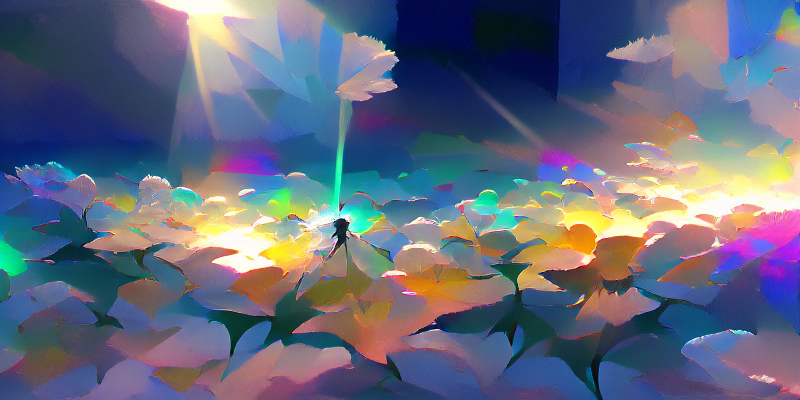

i: 375, loss: 9.936, losses: 0, 0.827856, 0.178838, 0.817678, 0.940836, 0.840108, 0.419747, 0.257826, 0.249048, 0.243664, 0.827066, 0.402478, 0.422614, 0.684232, 0.794721, 0.791052, 0.442415, 0.778568, 0.877723, -0.673715, 0.539093, -0.444972, -0.426518, 0.434855, 0.434993, 0.251494, 0.25739, 0.860174, 0.406837, 0.393714, 0.244541, 0.884887, -0.449753, -0.44729, -0.41847, -0.449746, -0.458535, -0.8937, -0.905749
iteration:375, time:494s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing edges:0.5'

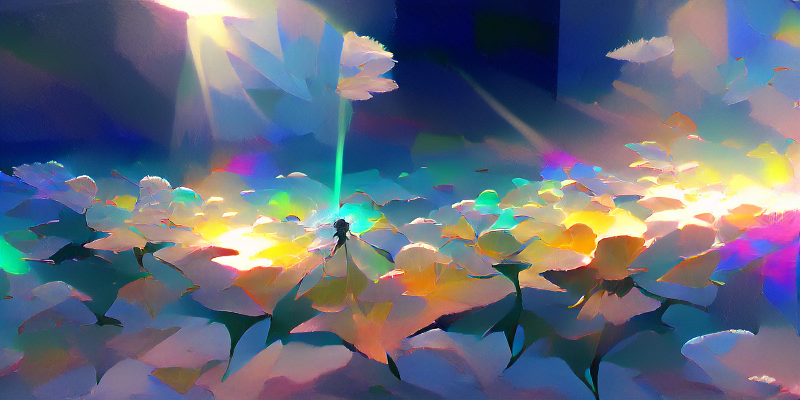

i: 400, loss: 9.9461, losses: 0, 0.833926, 0.177008, 0.818167, 0.938773, 0.836577, 0.418068, 0.257474, 0.248682, 0.243994, 0.827947, 0.402477, 0.423364, 0.686445, 0.797017, 0.797118, 0.441705, 0.782956, 0.877089, -0.67335, 0.536666, -0.445617, -0.42428, 0.43404, 0.43556, 0.2503, 0.256637, 0.859003, 0.40614, 0.394287, 0.244577, 0.883667, -0.450298, -0.448517, -0.417576, -0.449344, -0.458412, -0.891938, -0.904231
iteration:400, time:523s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing edges:0.5',

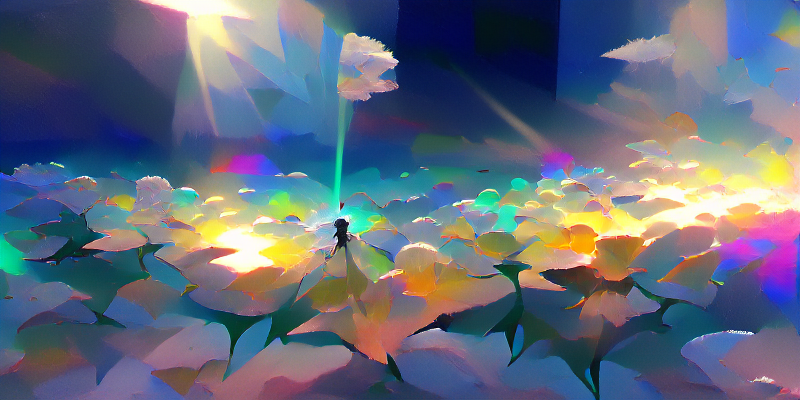

i: 425, loss: 9.92021, losses: 0, 0.83328, 0.177577, 0.816801, 0.936841, 0.840553, 0.420814, 0.259164, 0.251879, 0.244958, 0.82599, 0.400722, 0.421245, 0.683172, 0.795175, 0.792862, 0.442086, 0.780656, 0.878027, -0.675441, 0.536281, -0.445028, -0.426506, 0.434015, 0.434521, 0.250801, 0.256023, 0.85623, 0.406105, 0.393168, 0.244625, 0.883091, -0.449572, -0.448304, -0.417758, -0.450098, -0.459263, -0.895216, -0.909269
iteration:425, time:553s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing edges:

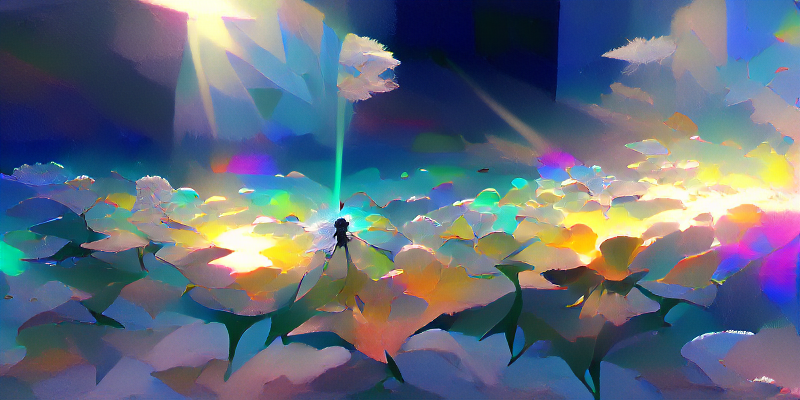

i: 450, loss: 9.97047, losses: 0, 0.835224, 0.177959, 0.823731, 0.936588, 0.8436, 0.420511, 0.259694, 0.250243, 0.244904, 0.827754, 0.402161, 0.423436, 0.687149, 0.799562, 0.79769, 0.442421, 0.783881, 0.875961, -0.676117, 0.538122, -0.444268, -0.425694, 0.435034, 0.434995, 0.250455, 0.256166, 0.856297, 0.407657, 0.39443, 0.244419, 0.885617, -0.448581, -0.44874, -0.416998, -0.448989, -0.459511, -0.893334, -0.902963
iteration:450, time:583s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing edges:0.

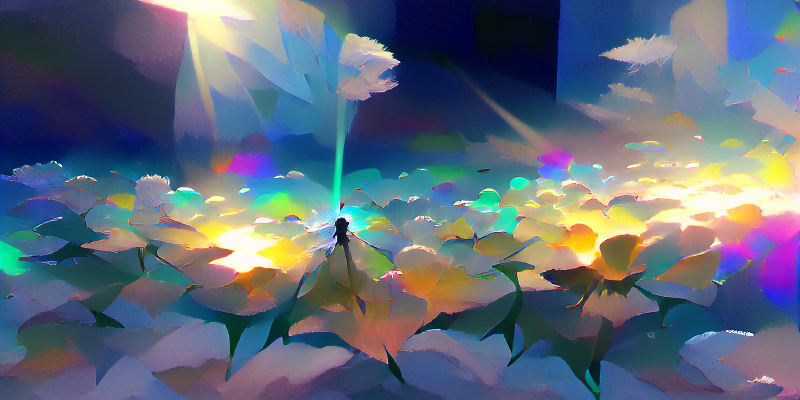

i: 475, loss: 9.92068, losses: 0, 0.835039, 0.176356, 0.809379, 0.947253, 0.842339, 0.420107, 0.256546, 0.248665, 0.241676, 0.824204, 0.402986, 0.422592, 0.683317, 0.793731, 0.792136, 0.441726, 0.775499, 0.874752, -0.673682, 0.535335, -0.443654, -0.424305, 0.433622, 0.435526, 0.249419, 0.257429, 0.855435, 0.405074, 0.390502, 0.242756, 0.885386, -0.447566, -0.447373, -0.41561, -0.448386, -0.457426, -0.893652, -0.906454
iteration:475, time:613s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing edge

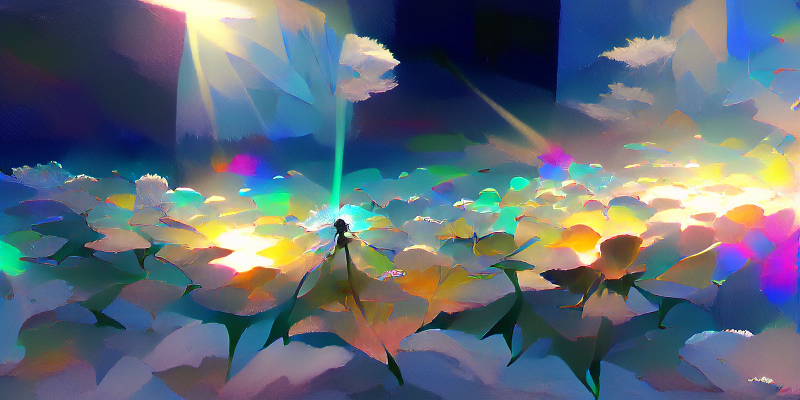

i: 500, loss: 9.92059, losses: 0, 0.836876, 0.177813, 0.81683, 0.936213, 0.841215, 0.420428, 0.256407, 0.249408, 0.242785, 0.826785, 0.399829, 0.423218, 0.680875, 0.790029, 0.790822, 0.441011, 0.780169, 0.877744, -0.675178, 0.538057, -0.444699, -0.426249, 0.433074, 0.434138, 0.249306, 0.255519, 0.85465, 0.405413, 0.393566, 0.244556, 0.884947, -0.448132, -0.446865, -0.415663, -0.447071, -0.457768, -0.89315, -0.906318
iteration:500, time:643s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing edges:

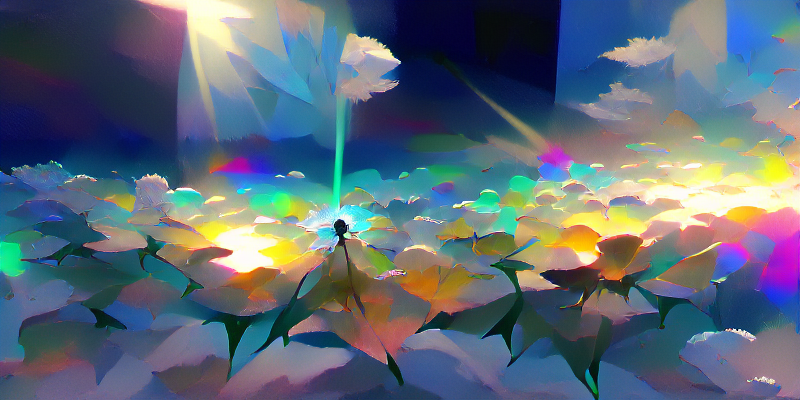

i: 525, loss: 9.88756, losses: 0, 0.825202, 0.178192, 0.820292, 0.926573, 0.83213, 0.41863, 0.257266, 0.248651, 0.242537, 0.827485, 0.39576, 0.420887, 0.682591, 0.792772, 0.794937, 0.440096, 0.780717, 0.873215, -0.674369, 0.538652, -0.443079, -0.424576, 0.431676, 0.430959, 0.249406, 0.254029, 0.855803, 0.404077, 0.394667, 0.245002, 0.881821, -0.449158, -0.447372, -0.416219, -0.447747, -0.45766, -0.891784, -0.904506
iteration:525, time:673s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing edges:0

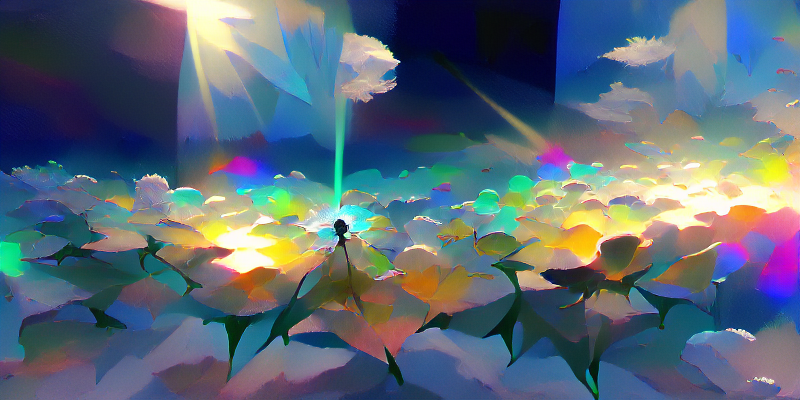

i: 550, loss: 9.90505, losses: 0, 0.832331, 0.178248, 0.81617, 0.93458, 0.841946, 0.422931, 0.257413, 0.250006, 0.244529, 0.83165, 0.402743, 0.422484, 0.680703, 0.790355, 0.788361, 0.442053, 0.779052, 0.877969, -0.678559, 0.541775, -0.446045, -0.428218, 0.432301, 0.435132, 0.252366, 0.256585, 0.856162, 0.406761, 0.393103, 0.245172, 0.884086, -0.452133, -0.446488, -0.420194, -0.451585, -0.461296, -0.894271, -0.913128
iteration:550, time:702s, seed:1844374079, size:[800, 400]
["no man's sky by artem rhads chebokha", 'Mammatus Cloud:0.2', 'Crepuscular Ray:1', 'Burgundy Dahlia:1', 'Sky Blue:1', 'sunset:0.5', 'sun halo:0.3', 'light pillar:0.3', 'god rays:0.3', 'saturation:1', 'flower field:0.5', 'field of giant mushrooms:0.5', 'spot lights:0.8', 'shards of light:1', 'prismatic:1', 'happy:0.5', 'iridescent:1', 'monochromatic:1', 'grain:-0.8', 'film grain:0.6', 'black:-0.5', 'muted colors:-0.5', 'green:0.5', 'yellow:0.5', 'grassy field:0.3', 'rose garden:0.3', 'blur:1', 'softly glowing edges:

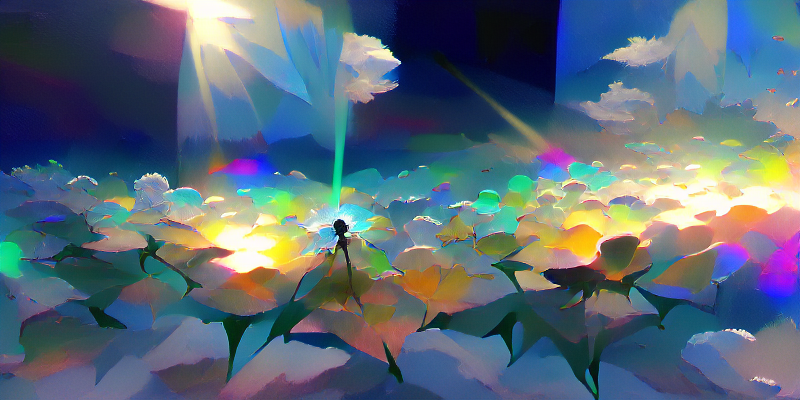

In [ ]:
#@title 2. Set these arguments, then run me!  (If you want to change these, you only need to rerun this cell.)
prompt = ["no man's sky by artem rhads chebokha","Mammatus Cloud:0.2","Crepuscular Ray:1","Burgundy Dahlia:1","Sky Blue:1","sunset:0.5","sun halo:0.3","light pillar:0.3","god rays:0.3","saturation:1","flower field:0.5","field of giant mushrooms:0.5","spot lights:0.8","shards of light:1","prismatic:1","happy:0.5","iridescent:1","monochromatic:1","grain:-0.8","film grain:0.6","black:-0.5","muted colors:-0.5","green:0.5","yellow:0.5","grassy field:0.3","rose garden:0.3","blur:1","softly glowing edges:0.5","iridescent gradients:0.5","rainbow gradients:0.3","smooth:1","cars:-0.5","man made object:-0.5","windows:-0.5","buildings:-0.5","details:-0.5","human features:-1","hair:-1"] #@param {type:"raw"}
#@markdown add as many prompts as you want, with an optional strength up to 1. for negative prompts, give it a negative value between up to -1. eg
#@markdown ["painting of the sea","blue:-0.4"] will penalise any blue by 40%. use this to avoid floating skies, weird faces, etc. if you don't specify a number with :, that prompt will default to 1, aka 100% strength.
width =  800#@param {type:"number"}
height =  400 #@param {type:"number"}
#@markdown _warning, much bigger sizes than this will run out of RAM (it will crash and tell you so)_<br>
start_from_image = False #@param {type:"boolean"}
init_image = "/content/emrakul.jpg" #@param {type:"string"}
max_iters =   1600#@param {type:"number"}
random_seed = 800032 #@param {type:"integer"}
#@markdown _if true, above seed is ignored and output is always random_
randomise_seeds = True #@param {type:"boolean"}

args = argparse.Namespace(
    prompts=prompt,

    size=[width, height],
    initial_image = init_image,
    init_weight= 0.5,

    # clip model settings
    clip_model='ViT-B/32',
    vqgan_config='vqgan_imagenet_f16_16384.yaml',         
    vqgan_checkpoint='vqgan_imagenet_f16_16384.ckpt',
    step_size=0.1,
    
    # cutouts / crops
    cutn=64,
    cut_pow=1,

    # display
    display_freq=25,
    seed=random_seed,
    use_augs = True,
    noise_fac= 0.1,
    ema_val = 0.99,

    record_generation=True,

    # noise and other constraints
    use_noise = None,
    constraint_regions = False,#
    
    # add noise to embedding
    noise_prompt_weights = None,
    noise_prompt_seeds = [14575],#

    # mse settings
    mse_withzeros = True,
    mse_decay_rate = 50,
    mse_epoches = 5,
    mse_quantize = True,

    # end itteration
    max_itter = max_iters,
)

mse_decay = 0
if args.init_weight:
  mse_decay = args.init_weight / args.mse_epoches

# <AUGMENTATIONS>
augs = nn.Sequential(
    
    K.RandomHorizontalFlip(p=0.5),
    K.RandomAffine(degrees=30, translate=0.1, p=0.8, padding_mode='border'), # padding_mode=2
    K.RandomPerspective(0.2,p=0.4, ),
    K.ColorJitter(hue=0.01, saturation=0.01, p=0.7),
    )

noise = noise_gen([1, 3, args.size[0], args.size[1]])
image = TF.to_pil_image(noise.div(5).add(0.5).clamp(0, 1)[0])
image.save('init3.png')

#####

#@title Default title text
from PIL import Image, ImageDraw

if args.constraint_regions and start_from_image == True:
    
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

    toksX, toksY = args.size[0] // 16, args.size[1] // 16

    pil_image = Image.open(args.initial_image).convert('RGB')
    pil_image = pil_image.resize((toksX * 16, toksY * 16), Image.LANCZOS)

    width, height = pil_image.size

    d = ImageDraw.Draw(pil_image)
    for i in range(0,width,16):
        d.text((i+4,0), f"{int(i/16)}", fill=(50,200,100))
    for i in range(0,height,16):
        d.text((4,i), f"{int(i/16)}", fill=(50,200,100))

    pil_image = TF.to_tensor(pil_image)

    #print(pil_image.shape)
    for i in range(pil_image.shape[1]):
      for j in range(pil_image.shape[2]):
        if i%16 == 0 or j%16 ==0:
          pil_image[:,i,j] = 0

    # select region
    c_h = [16,32]
    c_w = [0,40]

    c_hf = [i*16 for i in c_h]
    c_wf = [i*16 for i in c_w]

    pil_image[0,c_hf[0]:c_hf[1],c_wf[0]:c_wf[1]] = 0

    TF.to_pil_image(pil_image.cpu()).save('progress.png')
    display.display(display.Image('progress.png'))

    z_mask = torch.zeros([1, 256, int(height/16), int(width/16)]).to(device)
    z_mask[:,:,c_h[0]:c_h[1],c_w[0]:c_w[1]] = 1

#####

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

time_start = time.time() # start timer

#print('Using device:', device)
#print('using prompts: ', args.prompts)

tv_loss = TVLoss() 

model = load_vqgan_model(args.vqgan_config, args.vqgan_checkpoint).to(device)
perceptor = clip.load(args.clip_model, jit=False)[0].eval().requires_grad_(False).to(device)
mse_weight = args.init_weight

cut_size = perceptor.visual.input_resolution
# e_dim = model.quantize.e_dim

if args.vqgan_checkpoint == 'vqgan_openimages_f16_8192.ckpt':
    e_dim = 256
    n_toks = model.quantize.n_embed
    z_min = model.quantize.embed.weight.min(dim=0).values[None, :, None, None]
    z_max = model.quantize.embed.weight.max(dim=0).values[None, :, None, None]
else:
    e_dim = model.quantize.e_dim
    n_toks = model.quantize.n_e
    z_min = model.quantize.embedding.weight.min(dim=0).values[None, :, None, None]
    z_max = model.quantize.embedding.weight.max(dim=0).values[None, :, None, None]


make_cutouts = MakeCutouts(cut_size, args.cutn, cut_pow=args.cut_pow)

f = 2**(model.decoder.num_resolutions - 1)
toksX, toksY = args.size[0] // f, args.size[1] // f

if randomise_seeds == True:
    args.seed = np.random.randint(0,4294967295)

if args.seed is not None:
    torch.manual_seed(args.seed)

if start_from_image == True:
    pil_image = Image.open(args.initial_image).convert('RGB')
    pil_image = pil_image.resize((toksX * 16, toksY * 16), Image.LANCZOS)
    pil_image = TF.to_tensor(pil_image)
    if args.use_noise:
      pil_image = pil_image + args.use_noise * torch.randn_like(pil_image) 
    z, *_ = model.encode(pil_image.to(device).unsqueeze(0) * 2 - 1)

else:
    
    one_hot = F.one_hot(torch.randint(n_toks, [toksY * toksX], device=device), n_toks).float()

    if args.vqgan_checkpoint == 'vqgan_openimages_f16_8192.ckpt':
        z = one_hot @ model.quantize.embed.weight
    else:
        z = one_hot @ model.quantize.embedding.weight
    z = z.view([-1, toksY, toksX, e_dim]).permute(0, 3, 1, 2)


z = EMATensor(z, args.ema_val)

if args.mse_withzeros and not args.initial_image:
  z_orig = torch.zeros_like(z.tensor)
else:
  z_orig = z.tensor.clone()


opt = optim.Adam(z.parameters(), lr=args.step_size, weight_decay=0.00000000)

normalize = transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                                 std=[0.26862954, 0.26130258, 0.27577711])

pMs = []

if args.noise_prompt_weights and args.noise_prompt_seeds:
  for seed, weight in zip(args.noise_prompt_seeds, args.noise_prompt_weights):
    gen = torch.Generator().manual_seed(seed)
    embed = torch.empty([1, perceptor.visual.output_dim]).normal_(generator=gen)
    pMs.append(Prompt(embed, weight).to(device))

for prompt in args.prompts:
    txt, weight, stop = parse_prompt(prompt)
    embed = perceptor.encode_text(clip.tokenize(txt).to(device)).float()
    pMs.append(Prompt(embed, weight, stop).to(device))
    # pMs[0].embed = pMs[0].embed + Prompt(embed, weight, stop).embed.to(device)


def synth(z, quantize=True):
    if args.constraint_regions:
      z = replace_grad(z, z * z_mask)

    if quantize:
      if args.vqgan_checkpoint == 'vqgan_openimages_f16_8192.ckpt':
        z_q = vector_quantize(z.movedim(1, 3), model.quantize.embed.weight).movedim(3, 1)
      else:
        z_q = vector_quantize(z.movedim(1, 3), model.quantize.embedding.weight).movedim(3, 1)

    else:
      z_q = z.model

    return clamp_with_grad(model.decode(z_q).add(1).div(2), 0, 1)

@torch.no_grad()
def checkin(i, losses):
    losses_str = ', '.join(f'{loss.item():g}' for loss in losses)
    tqdm.write(f'i: {i}, loss: {sum(losses).item():g}, losses: {losses_str}')
    print(f'iteration:{i}, time:{int(time.time()-time_start)}s, seed:{args.seed}, size:{args.size}')
    print(f'{args.prompts}')
    out = synth(z.average, True)

    TF.to_pil_image(out[0].cpu()).save('progress.png')   
    display.display(display.Image('progress.png')) 


def ascend_txt():
    global mse_weight

    out = synth(z.tensor)

    if args.record_generation:
      with torch.no_grad():
        global vid_index
        out_a = synth(z.average, True)
        TF.to_pil_image(out_a[0].cpu()).save(f'/content/vids/{vid_index}.png')
        vid_index += 1

    cutouts = make_cutouts(out)

    if args.use_augs:
      cutouts = augs(cutouts)

    if args.noise_fac:
      facs = cutouts.new_empty([args.cutn, 1, 1, 1]).uniform_(0, args.noise_fac)
      cutouts = cutouts + facs * torch.randn_like(cutouts)

    iii = perceptor.encode_image(normalize(cutouts)).float()

    result = []

    if args.init_weight:
        
        global z_orig
        
        result.append(F.mse_loss(z.tensor, z_orig) * mse_weight / 2)
        # result.append(F.mse_loss(z, z_orig) * ((1/torch.tensor((i)*2 + 1))*mse_weight) / 2)

        with torch.no_grad():
          if i > 0 and i%args.mse_decay_rate==0 and i <= args.mse_decay_rate*args.mse_epoches:

            if args.mse_quantize:
              z_orig = vector_quantize(z.average.movedim(1, 3), model.quantize.embedding.weight).movedim(3, 1)#z.average
            else:
              z_orig = z.average.clone()

            if mse_weight - mse_decay > 0 and mse_weight - mse_decay >= mse_decay:
              mse_weight = mse_weight - mse_decay
              print(f"updated mse weight: {mse_weight}")
            else:
              mse_weight = 0
              print(f"updated mse weight: {mse_weight}")

    for prompt in pMs:
        result.append(prompt(iii))

    return result

vid_index = 0
def train(i):
    
    opt.zero_grad()
    lossAll = ascend_txt()

    if i % args.display_freq == 0:
        checkin(i, lossAll)
    
    loss = sum(lossAll)

    loss.backward()
    opt.step()
    z.update()

i = 0
try:
    with tqdm() as pbar:
        while True and i != args.max_itter:

            train(i)

            if i > 0 and i%args.mse_decay_rate==0 and i <= args.mse_decay_rate * args.mse_epoches:
              z = EMATensor(z.average, args.ema_val)
              opt = optim.Adam(z.parameters(), lr=args.step_size, weight_decay=0.00000000)

            i += 1
            pbar.update()

except KeyboardInterrupt:
    pass


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# create video

In [ ]:
%cd vids

images = "%d.png"
video = "/content/video4.mp4"
!ffmpeg -r 15 -i $images -crf 30 -s 368x768 -pix_fmt yuv420p $video

%cd ..

delete all frames from folder

In [ ]:
%cd vids
%rm *.png
%cd ..